<a href="https://colab.research.google.com/github/steinhaug/stable-diffusion/blob/main/grid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
saved_grid_count = 1

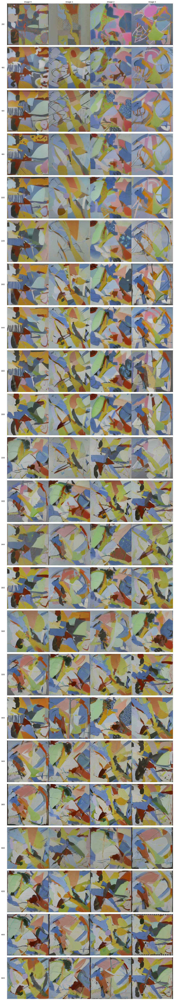

In [19]:
#@title 3/4 Generate a grid of preview images from the saved checkpoints
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

OUTPUT_DIR = "/content/drive/MyDrive/sd_weights/skmader/" #@param {type:"string"}
SAMPLES_DIR = "samples_4" #@param ["samples", "samples_2", "samples_3", "samples_4"]
MERGE_SAMPLE_FOLDERS = False #@param {type:"boolean"}

weights_folder = OUTPUT_DIR

folders = sorted([f for f in os.listdir(weights_folder) if f != "0"], key=lambda x: int(x))

if SAMPLES_DIR != "samples":
    MERGE_SAMPLE_FOLDERS = False
row = len(folders)
if MERGE_SAMPLE_FOLDERS:
    row = row * 2
col = len(os.listdir(os.path.join(weights_folder, folders[0], SAMPLES_DIR)))
scale = 4
fig, axes = plt.subplots(row, col, figsize=(col*scale, row*scale), gridspec_kw={'hspace': 0, 'wspace': 0})

i2 = 0
for i, folder in enumerate(folders):
    folder_path = os.path.join(weights_folder, folder)
    image_folder = os.path.join(folder_path, SAMPLES_DIR)
    images = [f for f in os.listdir(image_folder)]
    for j, image in enumerate(images):
        if row == 1:
            currAxes = axes[j]
        else:
            currAxes = axes[i2, j]
        if i == 0:
            currAxes.set_title(f"Image {j}")
        if j == 0:
            if MERGE_SAMPLE_FOLDERS:
                currAxes.text(-0.1, 0.5, "S1 " + folder, rotation=0, va='center', ha='center', transform=currAxes.transAxes)
            else:
                currAxes.text(-0.1, 0.5, folder, rotation=0, va='center', ha='center', transform=currAxes.transAxes)
        image_path = os.path.join(image_folder, image)
        img = mpimg.imread(image_path)
        currAxes.imshow(img, cmap='gray')
        currAxes.axis('off')

    if MERGE_SAMPLE_FOLDERS:
        i2 += 1
        image_folder = os.path.join(folder_path, "samples_2")
        images = [f for f in os.listdir(image_folder)]
        for j, image in enumerate(images):
            currAxes = axes[i2, j]
            if j == 0:
                currAxes.text(-0.1, 0.5, "S2 " + folder, rotation=0, va='center', ha='center', transform=currAxes.transAxes)
            image_path = os.path.join(image_folder, image)
            img = mpimg.imread(image_path)
            currAxes.imshow(img, cmap='gray')
            currAxes.axis('off')
    i2 += 1

plt.tight_layout()
plt.savefig(f'{saved_grid_count:04d}' + "_" + SAMPLES_DIR + '_grid.png', dpi=72)
saved_grid_count += 1